In [1]:
import pandas as pd
import json
import requests
import matplotlib.pylab as plt
import statsmodels.api as sm
from scipy.stats import norm, mstats

from itertools import groupby
from datetime import datetime as dt

In [2]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


C:\Users\P276495\AppData\Local\Continuum\Anaconda3\lib\site-packages\IPython\core\magics\pylab.py:161: UserWarning: pylab import has clobbered these variables: ['plt', 'norm']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [3]:
METRICS_ALL = 'accessors,new_technical_debt,blocker_violations,conditions_to_cover,new_it_conditions_to_cover,new_conditions_to_cover,bugs,burned_budget,business_value,class_complexity_distribution,classes,code_smells,comment_lines,commented_out_code_lines,comment_lines_density,comment_lines_data,complexity,class_complexity,file_complexity,function_complexity,complexity_in_classes,complexity_in_functions,branch_coverage,new_it_branch_coverage,new_branch_coverage,conditions_by_line,confirmed_issues,coverage,new_it_coverage,coverage_line_hits_data,new_coverage,covered_conditions_by_line,critical_violations,last_commit_date,directories,duplicated_blocks,new_duplicated_blocks,duplicated_files,duplicated_lines,duplicated_lines_density,new_duplicated_lines,new_duplicated_lines_density,duplications_data,effort_to_reach_maintainability_rating_a,executable_lines_data,false_positive_issues,file_complexity_distribution,files,function_complexity_distribution,functions,generated_lines,generated_ncloc,info_violations,violations,it_conditions_to_cover,it_branch_coverage,it_conditions_by_line,it_coverage,it_coverage_line_hits_data,it_covered_conditions_by_line,it_line_coverage,it_lines_to_cover,it_uncovered_conditions,it_uncovered_lines,line_coverage,new_it_line_coverage,new_line_coverage,lines,ncloc,ncloc_language_distribution,new_lines,lines_to_cover,new_it_lines_to_cover,new_lines_to_cover,sqale_rating,new_maintainability_rating,major_violations,minor_violations,ncloc_data,new_blocker_violations,new_bugs,new_code_smells,new_critical_violations,new_info_violations,new_violations,new_major_violations,new_minor_violations,new_vulnerabilities,open_issues,overall_conditions_to_cover,new_overall_conditions_to_cover,overall_branch_coverage,new_overall_branch_coverage,overall_conditions_by_line,overall_coverage,overall_coverage_line_hits_data,new_overall_coverage,overall_covered_conditions_by_line,overall_line_coverage,new_overall_line_coverage,overall_lines_to_cover,new_overall_lines_to_cover,overall_uncovered_conditions,new_overall_uncovered_conditions,overall_uncovered_lines,new_overall_uncovered_lines,quality_profiles,projects,public_api,public_documented_api_density,public_undocumented_api,quality_gate_details,alert_status,reliability_rating,new_reliability_rating,reliability_remediation_effort,new_reliability_remediation_effort,reopened_issues,security_rating,new_security_rating,security_remediation_effort,new_security_remediation_effort,skipped_tests,development_cost,statements,team_size,sqale_index,sqale_debt_ratio,new_sqale_debt_ratio,uncovered_conditions,new_it_uncovered_conditions,new_uncovered_conditions,uncovered_lines,new_it_uncovered_lines,new_uncovered_lines,test_data,test_execution_time,test_errors,test_failures,test_success_density,tests,vulnerabilities,wont_fix_issues'
METRICS_NOTNULL = 'blocker_violations,bugs,classes,code_smells,comment_lines,comment_lines_density,complexity,class_complexity,file_complexity,function_complexity,complexity_in_classes,complexity_in_functions,confirmed_issues,critical_violations,last_commit_date,directories,duplicated_blocks,duplicated_files,duplicated_lines,duplicated_lines_density,effort_to_reach_maintainability_rating_a,false_positive_issues,file_complexity_distribution,files,function_complexity_distribution,functions,info_violations,violations,lines,ncloc,ncloc_language_distribution,sqale_rating,major_violations,minor_violations,open_issues,quality_profiles,quality_gate_details,alert_status,reliability_rating,reliability_remediation_effort,reopened_issues,security_rating,security_remediation_effort,development_cost,statements,sqale_index,sqale_debt_ratio,vulnerabilities,wont_fix_issues'
METRICS_NOTNULL_NOTSTRING = 'blocker_violations,bugs,classes,code_smells,comment_lines,comment_lines_density,complexity,class_complexity,file_complexity,function_complexity,complexity_in_classes,complexity_in_functions,confirmed_issues,critical_violations,last_commit_date,directories,duplicated_blocks,duplicated_files,duplicated_lines,duplicated_lines_density,effort_to_reach_maintainability_rating_a,false_positive_issues,files,functions,info_violations,violations,lines,ncloc,major_violations,minor_violations,open_issues,reliability_remediation_effort,reopened_issues,security_remediation_effort,development_cost,statements,sqale_index,sqale_debt_ratio,vulnerabilities,wont_fix_issues'
METRICS_NOTNULL_NOTSTRING_NOTLASTITEMVALUE = 'blocker_violations,bugs,classes,code_smells,comment_lines,comment_lines_density,complexity,class_complexity,file_complexity,function_complexity,confirmed_issues,critical_violations,last_commit_date,directories,duplicated_blocks,duplicated_files,duplicated_lines,duplicated_lines_density,effort_to_reach_maintainability_rating_a,false_positive_issues,files,functions,info_violations,violations,lines,ncloc,major_violations,minor_violations,open_issues,reliability_remediation_effort,reopened_issues,security_remediation_effort,development_cost,statements,sqale_index,sqale_debt_ratio,vulnerabilities,wont_fix_issues'
METRICS_MTD = 'code_smells,bugs,classes,lines,ncloc,sqale_index,violations,blocker_violations,critical_violations,major_violations,minor_violations'
METRICS_ECSA = 'complexity,class_complexity,file_complexity,function_complexity,comment_lines,comment_lines_density,duplicated_blocks,duplicated_files,duplicated_lines,duplicated_lines_density,violations,blocker_violations,critical_violations,major_violations,minor_violations,info_violations,open_issues,code_smells,sqale_index,sqale_debt_ratio,bugs,reliability_remediation_effort,vulnerabilities,security_remediation_effort,classes,directories,files,lines,ncloc,functions,statements'
METRICS = METRICS_ECSA
METRICS_LIST = METRICS.split(',')
metrics_list_length = len(METRICS_LIST)

# Classes

In [4]:
HETZNER_IP = '176.9.137.234'
UOM_PC_IP = '195.251.210.136'
UOM_DB_IP = '195.251.210.166'
RUG_IP = '129.125.5.170'
MACBOOK_IP = '145.97.138.131'
SONARQUBE_IP = HETZNER_IP

SONARQUBE_PORT = '9000'
REST_API_PORT = '8080'

COMMIT_STATS_API_URL = '/GitHubCommitStatsRest/webresources/commitstatsfiles/repo/'
COMMIT_STATS_API_CACHE_URL = '/GitHubCommitStatsCache/webresources/commitsstats/json/'
COMMIT_STATS_FILES_API_URL = '/api/commitStatsFiles'
COMMIT_STATS_FILES_PER_REPO_API_URL = COMMIT_STATS_FILES_API_URL + '/repo/'
REST_URL = COMMIT_STATS_FILES_PER_REPO_API_URL

PROTOCOL = 'http://'

class GitHubProject:
    def __init__(self, repo_id, owner, repo, language, sonarqube_ip=SONARQUBE_IP, rest_api_ip = UOM_DB_IP):
        self.repo_id = repo_id
        self.owner = owner
        self.repo = repo
        self.language = language
        self.sonarqube_ip = sonarqube_ip
        self.rest_api_ip = rest_api_ip
        self.sonarqube_project_key = self.owner+':'+self.repo
        self.rest_key = self.owner+'/'+self.repo
        self.timemachine_metrics_url = PROTOCOL + self.sonarqube_ip + ':' + SONARQUBE_PORT + '/api/'+ 'timemachine?' + 'resource=' + self.sonarqube_project_key + '&metrics='
        self.commit_stats_url = PROTOCOL + self.rest_api_ip + ':' + REST_API_PORT + REST_URL + str(self.repo_id)

# General functions

In [5]:
def get_rest_response(rest_url):
    response = requests.get(rest_url)
    return json.loads(response.text)

def jsonDate_to_date(date):
    return datetime.datetime.fromtimestamp(date / 1e3)

def get_date(date):
    return pd.Timestamp(date).date()

def plot(plt):
    plt.plot(figsize=(15,10))

In [6]:
def mk_test(x, alpha = 0.05):  
    """
    
    http://michaelpaulschramm.com/simple-time-series-trend-analysis/
    
    Input:
        x:   a vector of data
        alpha: significance level (0.05 default)

    Output:
        trend: tells the trend (increasing, decreasing or no trend)
        h: True (if trend is present) or False (if trend is absence)
        p: p value of the significance test
        z: normalized test statistics 

    Examples
    --------
      >>> x = np.random.rand(100)
      >>> trend,h,p,z = mk_test(x,0.05) 
    """
    n = len(x)

    # calculate S 
    s = 0
    for k in range(n-1):
        for j in range(k+1,n):
            s += np.sign(x[j] - x[k])

    # calculate the unique data
    unique_x = np.unique(x)
    g = len(unique_x)

    # calculate the var(s)
    if n == g: # there is no tie
        var_s = (n*(n-1)*(2*n+5))/18
    else: # there are some ties in data
        tp = np.zeros(unique_x.shape)
        for i in range(len(unique_x)):
            tp[i] = sum(unique_x[i] == x)
        var_s = (n*(n-1)*(2*n+5) + np.sum(tp*(tp-1)*(2*tp+5)))/18

    if s>0:
        z = (s - 1)/np.sqrt(var_s)
    elif s == 0:
            z = 0
    elif s<0:
        z = (s + 1)/np.sqrt(var_s)

    # calculate the p_value
    p = 2*(1-norm.cdf(abs(z))) # two tail test
    h = abs(z) > norm.ppf(1-alpha/2) 

    if (z<0) and h:
        trend = 'decreasing'
    elif (z>0) and h:
        trend = 'increasing'
    else:
        trend = 'no trend'

    return trend, h, p, z

# Functions for getting SonarQube timemachine metrics

In [7]:
def get_repos():
    repos = []
    
    repos.append(GitHubProject(160994,'apache','sling','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(160999,'apache','zookeeper','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(206338,'apache','directory-shared','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(206350,'apache','cayenne','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(206364,'apache','openjpa','Java',sonarqube_ip='176.9.137.234'))
    #repos.append(GitHubProject(206366,'apache','mina','Java',sonarqube_ip='129.125.5.41'))
    repos.append(GitHubProject(206368,'apache','poi','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(206378,'apache','commons-lang','Java',sonarqube_ip='176.9.137.234'))
    #repos.append(GitHubProject(206398,'apache','httpcore','Java',sonarqube_ip='145.97.155.98'))
    #repos.append(GitHubProject(206452,'apache','roller','Java',sonarqube_ip='129.125.5.41'))
    repos.append(GitHubProject(206483,'apache','maven','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(318103,'apache','pdfbox','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(322018,'apache','aries','Java',sonarqube_ip='176.9.137.234'))
    #repos.append(GitHubProject(507775,'elastic','elasticsearch','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(688352,'apache','jmeter','Java',sonarqube_ip='176.9.137.234'))
    #repos.append(GitHubProject(832680,'apache','maven-surefire','Java',sonarqube_ip='129.125.5.41'))
    repos.append(GitHubProject(892275,'square','retrofit','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(1148753,'spring-projects','spring-framework','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(1553754,'eclipse','orion.server','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(1553787,'eclipse','egit','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(1553790,'eclipse','jgit','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(1553793,'eclipse','linuxtools','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(1936771,'google','truth','Java',sonarqube_ip='145.97.155.98'))
    repos.append(GitHubProject(2108481,'spring-projects','spring-security-oauth','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(2153096,'apache','sqoop','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(2198510,'apache','flume','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(2211243,'apache','kafka','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(2282376,'apache','giraph','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(2304277,'spring-projects','spring-roo','Java',sonarqube_ip='176.9.137.234'))
    #repos.append(GitHubProject(2442457,'apache','ambari','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(2493904,'apache','tomcat','Java',sonarqube_ip='176.9.137.234'))
    #repos.append(GitHubProject(2740148,'apache','opennlp','Java',sonarqube_ip='129.125.5.41'))
    repos.append(GitHubProject(5152285,'square','okhttp','Java',sonarqube_ip='145.97.155.98'))
    #repos.append(GitHubProject(10230369,'google','auto','Java',sonarqube_ip='145.97.155.98'))
    #repos.append(GitHubProject(13414105,'python','peps','Python',sonarqube_ip='145.97.155.98'))
    repos.append(GitHubProject(15698466,'apache','jclouds','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(15928650,'apache','struts','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(16977479,'apache','cxf','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(26389457,'apache','tomcat80','Java',sonarqube_ip='176.9.137.234'))
    repos.append(GitHubProject(27911088,'apache','nifi','Java',sonarqube_ip='176.9.137.234'))
    #repos.append(GitHubProject(32848140,'apache','zeppelin','Java',sonarqube_ip='145.97.155.98'))
    #repos.append(GitHubProject(41348333,'apache','apex-core','Java',sonarqube_ip='129.125.5.41'))
    #repos.append(GitHubProject(41348334,'apache','apex-malhar','Java',sonarqube_ip='129.125.5.41'))
    
#     repos.append(GitHubProject(106310,'junit-team','junit4','Java'))
#     repos.append(GitHubProject(160994,'apache','sling','Java'))
#     repos.append(GitHubProject(160999,'apache','zookeeper','Java'))
#     repos.append(GitHubProject(161000,'apache','tomcat60','Java'))
#     repos.append(GitHubProject(161005,'apache','jspwiki','Java'))
#     repos.append(GitHubProject(205403,'apache','ofbiz','Java'))
#     repos.append(GitHubProject(205414,'apache','felix','Java'))
#     repos.append(GitHubProject(206317,'apache','camel','Java'))
#     repos.append(GitHubProject(206318,'apache','fop','Java'))
#     repos.append(GitHubProject(206338,'apache','directory-shared','Java'))
#     repos.append(GitHubProject(206350,'apache','cayenne','Java'))
#     repos.append(GitHubProject(206357,'apache','pig','Java'))
#     repos.append(GitHubProject(206362,'apache','commons-collections','Java'))
#     repos.append(GitHubProject(206364,'apache','openjpa','Java'))
#     repos.append(GitHubProject(206366,'apache','mina','Java'))
#     repos.append(GitHubProject(206368,'apache','poi','Java'))
#     repos.append(GitHubProject(206370,'apache','nutch','Java'))
#     repos.append(GitHubProject(206378,'apache','commons-lang','Java'))
#     repos.append(GitHubProject(206387,'apache','activemq','Java'))
#     repos.append(GitHubProject(206396,'apache','commons-io','Java'))
#     repos.append(GitHubProject(206398,'apache','httpcore','Java'))
#     repos.append(GitHubProject(206402,'apache','httpclient','Java'))
#     repos.append(GitHubProject(206403,'apache','jackrabbit','Java'))
#     repos.append(GitHubProject(206412,'apache','wicket','Java'))
#     repos.append(GitHubProject(206424,'apache','cassandra','Java'))
#     repos.append(GitHubProject(206444,'apache','hive','Java'))
#     repos.append(GitHubProject(206445,'apache','batik','Java'))
#     repos.append(GitHubProject(206452,'apache','roller','Java'))
#     repos.append(GitHubProject(206483,'apache','maven','Java'))
#     repos.append(GitHubProject(212343,'apache','commons-cli','Java'))
#     repos.append(GitHubProject(230296,'apache','wss4j','Java'))
#     repos.append(GitHubProject(318103,'apache','pdfbox','Java'))
#     repos.append(GitHubProject(322018,'apache','aries','Java'))
#     repos.append(GitHubProject(460078,'angular','angular.js','JavaScript'))
#     repos.append(GitHubProject(507775,'elastic','elasticsearch','Java'))
#     repos.append(GitHubProject(605999,'twitter','flockdb','Scala'))
#     repos.append(GitHubProject(688352,'apache','jmeter','Java'))
#     repos.append(GitHubProject(732593,'cloudera','hue','Python'))
#     repos.append(GitHubProject(790031,'openstack','nova','Python'))
#     repos.append(GitHubProject(832680,'apache','maven-surefire','Java'))
#     repos.append(GitHubProject(832681,'apache','tomcat70','Java'))
#     repos.append(GitHubProject(892275,'square','retrofit','Java'))
#     repos.append(GitHubProject(939852,'apache','commons-validator','Java'))
#     repos.append(GitHubProject(961036,'hibernate','hibernate-orm','Java'))
#     repos.append(GitHubProject(972205,'hibernate','hibernate-validator','Java'))
#     repos.append(GitHubProject(990281,'hibernate','hibernate-search','Java'))
#     repos.append(GitHubProject(1020639,'Pylons','pyramid','Python'))
#     repos.append(GitHubProject(1064563,'netty','netty','Java'))
#     repos.append(GitHubProject(1148753,'spring-projects','spring-framework','Java'))
#     repos.append(GitHubProject(1158315,'apache','stanbol','Java'))
#     repos.append(GitHubProject(1446467,'pypa','pip','Python'))
#     repos.append(GitHubProject(1463755,'spring-projects','spring-amqp-samples','Java'))
#     repos.append(GitHubProject(1553754,'eclipse','orion.server','Java'))
#     repos.append(GitHubProject(1553787,'eclipse','egit','Java'))
#     repos.append(GitHubProject(1553790,'eclipse','jgit','Java'))
#     repos.append(GitHubProject(1553793,'eclipse','linuxtools','Java'))
#     repos.append(GitHubProject(1608936,'hibernate','hibernate-ogm','Java'))
#     repos.append(GitHubProject(1644192,'apache','ftpserver','Java'))
#     repos.append(GitHubProject(1936771,'google','truth','Java'))
#     repos.append(GitHubProject(1937202,'gitblit','gitblit','Java'))
#     repos.append(GitHubProject(2049379,'Netflix','curator','Java'))
#     repos.append(GitHubProject(2108481,'spring-projects','spring-security-oauth','Java'))
#     repos.append(GitHubProject(2153096,'apache','sqoop','Java'))
#     repos.append(GitHubProject(2198510,'apache','flume','Java'))
#     repos.append(GitHubProject(2204545,'apache','rampart','Java'))
#     repos.append(GitHubProject(2211243,'apache','kafka','Java'))
#     repos.append(GitHubProject(2226508,'apache','pivot','Java'))
#     repos.append(GitHubProject(2282376,'apache','giraph','Java'))
#     repos.append(GitHubProject(2304277,'spring-projects','spring-roo','Java'))
#     repos.append(GitHubProject(2340549,'playframework','playframework','Scala'))
#     repos.append(GitHubProject(2383782,'apache','oozie','Java'))
#     repos.append(GitHubProject(2442457,'apache','ambari','Java'))
#     repos.append(GitHubProject(2493904,'apache','tomcat','Java'))
#     repos.append(GitHubProject(2524488,'apache','accumulo','Java'))
#     repos.append(GitHubProject(2740148,'apache','opennlp','Java'))
#     repos.append(GitHubProject(2888818,'scala','scala','Scala'))
#     repos.append(GitHubProject(3604630,'eclipse','org.aspectj','Java'))
#     repos.append(GitHubProject(3956248,'apache','chukwa','Java'))
#     repos.append(GitHubProject(4164482,'django','django','Python'))
#     repos.append(GitHubProject(4368712,'jersey','jersey','Java'))
#     repos.append(GitHubProject(4416959,'apache','tapestry-5','Java'))
#     repos.append(GitHubProject(4748416,'apache','manifoldcf','Java'))
#     repos.append(GitHubProject(5152285,'square','okhttp','Java'))
#     repos.append(GitHubProject(5212656,'apache','odftoolkit','Java'))
#     repos.append(GitHubProject(5683653,'apache','drill','Java'))
#     repos.append(GitHubProject(5970647,'eclipse','dltk.core','Java'))
#     repos.append(GitHubProject(6207167,'mockito','mockito','Java'))
#     repos.append(GitHubProject(6235174,'conda','conda','Python'))
#     repos.append(GitHubProject(6290993,'apache','crunch','Java'))
#     repos.append(GitHubProject(6296790,'spring-projects','spring-boot','Java'))
#     repos.append(GitHubProject(6766558,'Netflix','Hystrix','Java'))
#     repos.append(GitHubProject(6898381,'apache','cordova-android','Java'))
#     repos.append(GitHubProject(6929734,'openstack','cinder','Python'))
#     repos.append(GitHubProject(6935442,'apache','isis','Java'))
#     repos.append(GitHubProject(7053637,'python','mypy','Python'))
#     repos.append(GitHubProject(7437073,'apache','jena','Java'))
#     repos.append(GitHubProject(7508411,'ReactiveX','RxJava','Java'))
#     repos.append(GitHubProject(7691631,'docker','docker','Go'))
#     repos.append(GitHubProject(7728562,'apache','oodt','Java'))
#     repos.append(GitHubProject(7748336,'apache','tomee','Java'))
#     repos.append(GitHubProject(9290699,'apache','tez','Java'))
#     repos.append(GitHubProject(9759448,'apache','cloudstack','Java'))
#     repos.append(GitHubProject(10230369,'google','auto','Java'))
#     repos.append(GitHubProject(10270250,'facebook','react','JavaScript'))
#     repos.append(GitHubProject(10329619,'apache','oltu','Java'))
#     repos.append(GitHubProject(10616263,'apache','sis','Java'))
#     repos.append(GitHubProject(10637893,'apache','commons-csv','Java'))
#     repos.append(GitHubProject(10637896,'apache','logging-log4j2','Java'))
#     repos.append(GitHubProject(11384366,'apache','commons-bcel','Java'))
#     repos.append(GitHubProject(11384368,'apache','commons-vfs','Java'))
#     repos.append(GitHubProject(11543457,'apache','falcon','Java'))
#     repos.append(GitHubProject(11943595,'apache','metamodel','Java'))
#     repos.append(GitHubProject(12169108,'google','closure-library','JavaScript'))
#     repos.append(GitHubProject(13414105,'python','peps','Python'))
#     repos.append(GitHubProject(13968333,'openstack','solum','Python'))
#     repos.append(GitHubProject(14135467,'apache','aurora','Java'))
#     repos.append(GitHubProject(14135470,'apache','storm','Java'))
#     repos.append(GitHubProject(14135471,'apache','usergrid','Java'))
#     repos.append(GitHubProject(15062869,'facebook','jest','JavaScript'))
#     repos.append(GitHubProject(15070661,'apache','uima-ruta','Java'))
#     repos.append(GitHubProject(15698466,'apache','jclouds','Java'))
#     repos.append(GitHubProject(15861701,'apache','helix','Java'))
#     repos.append(GitHubProject(15928650,'apache','struts','Java'))
#     repos.append(GitHubProject(16338711,'apache','airavata','Java'))
#     repos.append(GitHubProject(16389681,'google','j2objc','Java'))
#     repos.append(GitHubProject(16977479,'apache','cxf','Java'))
#     repos.append(GitHubProject(17049428,'apache','juddi','Java'))
#     repos.append(GitHubProject(17165658,'apache','spark','Scala'))
#     repos.append(GitHubProject(17310686,'apache','knox','Java'))
#     repos.append(GitHubProject(17537838,'apache','cxf-fediz','Java'))
#     repos.append(GitHubProject(18627126,'apache','archiva','Java'))
#     repos.append(GitHubProject(18845024,'google','closure-compiler','Java'))
#     repos.append(GitHubProject(19821157,'eclipse','birt','Java'))
#     repos.append(GitHubProject(19932015,'apache','gora','Java'))
#     repos.append(GitHubProject(20089857,'apache','hbase','Java'))
#     repos.append(GitHubProject(20089859,'apache','mahout','Java'))
#     repos.append(GitHubProject(20248084,'apache','ant','Java'))
#     repos.append(GitHubProject(20300177,'google','guava','Java'))
#     repos.append(GitHubProject(20432793,'apache','stratos','Java'))
#     repos.append(GitHubProject(20473418,'apache','phoenix','Java'))
#     repos.append(GitHubProject(20587599,'apache','flink','Java'))
#     repos.append(GitHubProject(21193524,'apache','calcite','Java'))
#     repos.append(GitHubProject(23418517,'apache','hadoop','Java'))
#     repos.append(GitHubProject(24928494,'apache','commons-math','Java'))
#     repos.append(GitHubProject(25623942,'apache','syncope','Java'))
#     repos.append(GitHubProject(26389457,'apache','tomcat80','Java'))
#     repos.append(GitHubProject(26525416,'apache','lens','Java'))
#     repos.append(GitHubProject(26951043,'apache','ctakes','Java'))
#     repos.append(GitHubProject(27911088,'apache','nifi','Java'))
#     repos.append(GitHubProject(28738447,'apache','kylin','Java'))
#     repos.append(GitHubProject(29028775,'facebook','react-native','JavaScript'))
#     repos.append(GitHubProject(29102367,'junit-team','junit5','Java'))
#     repos.append(GitHubProject(30449481,'apache','tinkerpop','Java'))
#     repos.append(GitHubProject(31006158,'apache','ignite','Java'))
#     repos.append(GitHubProject(31524768,'facebook','nuclide','JavaScript'))
#     repos.append(GitHubProject(31976266,'apache','asterixdb','Java'))
#     repos.append(GitHubProject(32137005,'apache','openmeetings','Java'))
#     repos.append(GitHubProject(32376873,'apache','vxquery','Java'))
#     repos.append(GitHubProject(32505934,'apache','commons-rdf','Java'))
#     repos.append(GitHubProject(32805981,'eclipse','gyrex','Java'))
#     repos.append(GitHubProject(32848140,'apache','zeppelin','Java'))
#     repos.append(GitHubProject(32935745,'eclipse','che','Java'))
#     repos.append(GitHubProject(33024207,'apache','polygene-java','Java'))
#     repos.append(GitHubProject(34039690,'apache','groovy','Java'))
#     repos.append(GitHubProject(34039691,'apache','qpid-java','Java'))
#     repos.append(GitHubProject(34839383,'apache','geode','Java'))
#     repos.append(GitHubProject(36057260,'apache','activemq-artemis','Java'))
#     repos.append(GitHubProject(40508605,'facebook','relay','JavaScript'))
#     repos.append(GitHubProject(41348333,'apache','apex-core','Java'))
#     repos.append(GitHubProject(41348334,'apache','apex-malhar','Java'))
#     repos.append(GitHubProject(45896813,'apache','incubator-systemml','Java'))
#     repos.append(GitHubProject(46271785,'digeo','UoMSecretarySpring','Java'))
#     repos.append(GitHubProject(47246080,'apache','brooklyn-library','Java'))
#     repos.append(GitHubProject(47246081,'apache','brooklyn-server','Java'))
#     repos.append(GitHubProject(50229487,'apache','lucene-solr','Java'))
#     repos.append(GitHubProject(50904245,'apache','beam','Java'))
#     repos.append(GitHubProject(51905353,'apache','arrow','Java'))
#     repos.append(GitHubProject(54767260,'apache','sentry','Java'))
#     repos.append(GitHubProject(55334027,'apache','tomcat85','Java'))
#     repos.append(GitHubProject(56128731,'apache','commons-crypto','Java'))
#     repos.append(GitHubProject(60115659,'eclipse','xtext-eclipse','Java'))
#     repos.append(GitHubProject(62117818,'apache','incubator-carbondata','Java'))
#     repos.append(GitHubProject(64458355,'apache','twill','Java'))
#     repos.append(GitHubProject(68273151,'apache','incubator-hivemall','Java'))
#     repos.append(GitHubProject(76634121,'apache','qpid-proton-j','Java'))
#     repos.append(GitHubProject(78186814,'apache','incubator-weex','Java'))
#     repos.append(GitHubProject(81799714,'apache','ofbiz-framework','Java'))
    
    return repos

In [8]:
def get_repos1():
    repos = []
    repos.append(GitHubProject(160994,'apache','sling','Java',sonarqube_ip='176.9.137.234'))
    return repos

In [9]:
def get_sonarqube_timemachine_metrics_DataFrame(ghp):
    json_data = get_sonarqube_timemachine_metrics(ghp)
    cells = get_cells(json_data)
    return transform_timemachine_metrics_to_series(cells)

def get_sonarqube_timemachine_metrics(ghp):
    return get_rest_response(ghp.timemachine_metrics_url + METRICS)

def get_cells(json_data):
    return json_data[0]['cells']  # cells - metric values

def get_colls(json_data):
    return json_data[0]['cols']  # cols - Metrcs

def get_no_of_versions(cells):
    return len(cells)

def transform_timemachine_metrics_to_series(cells):
    date_range_index = get_date_range_index_for_timemachine_metrics(cells)
    df = pd.DataFrame(index=date_range_index)
    for metric_index in range(0, metrics_list_length):
        s = pd.Series(index=date_range_index)
        for item in cells:
            s[pd.Timestamp(item.get('d')).date()] = item.get('v')[metric_index]
        df[METRICS_LIST[metric_index]] = s
    return df


def get_date_range_index_for_timemachine_metrics(cells):
    project_dates = get_project_dates(cells)
    min_project_date = min(project_dates)
    max_project_date = max(project_dates)
    return pd.date_range(start=min_project_date.date(), end=max_project_date.date(), freq='D')

def get_project_dates(cells):
    dates = []
    for item in cells:
        dates.append(pd.Timestamp(item.get('d')))
    return dates

# Perform the analysis

sling


C:\Users\P276495\AppData\Local\Continuum\Anaconda3\lib\site-packages\statsmodels\tsa\filters\filtertools.py:28: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return np.r_[[np.nan] * head, x, [np.nan] * tail]
C:\Users\P276495\AppData\Local\Continuum\Anaconda3\lib\site-packages\matplotlib\figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


zookeeper


C:\Users\P276495\AppData\Local\Continuum\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


directory-shared
cayenne
openjpa
poi
commons-lang
maven
pdfbox
aries
jmeter
retrofit
spring-framework
orion.server
egit
jgit
linuxtools
truth
spring-security-oauth
sqoop
flume
kafka
giraph
spring-roo
tomcat
okhttp
jclouds
struts
cxf
tomcat80
nifi


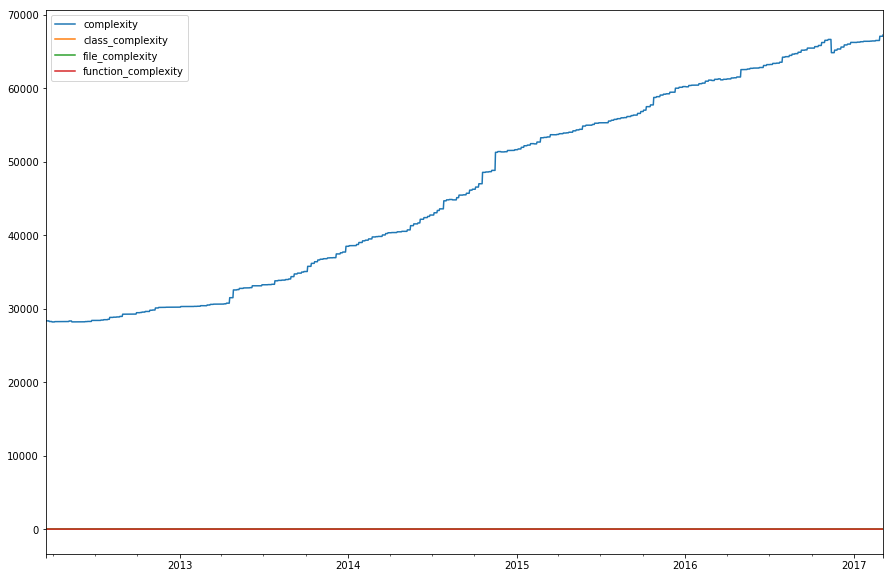

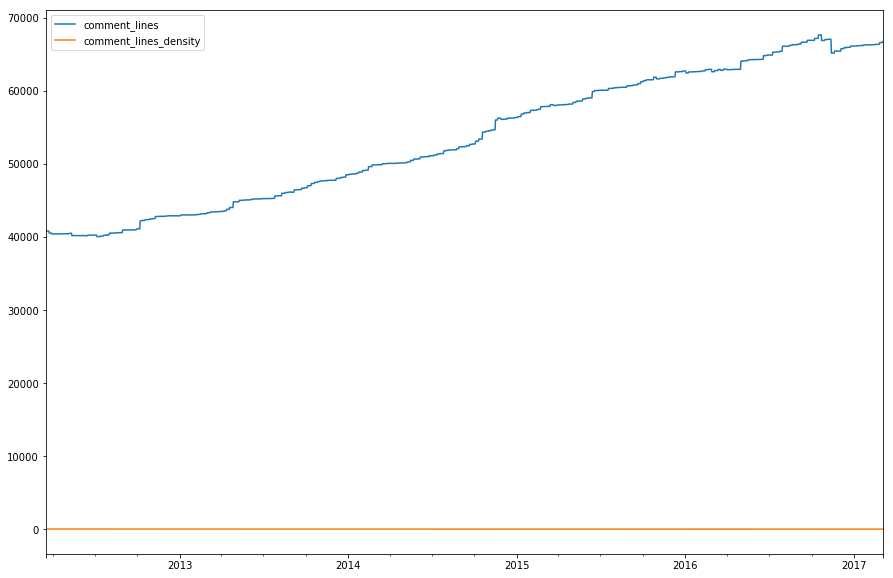

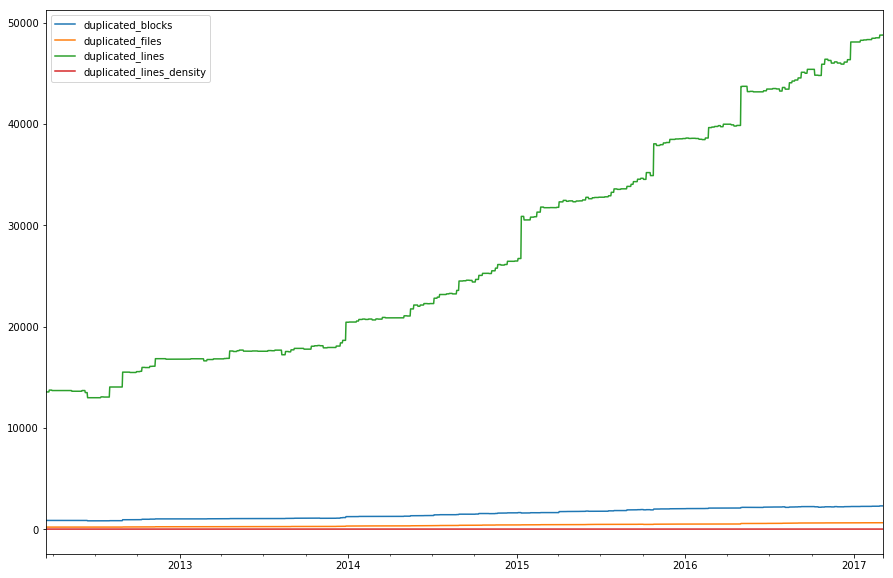

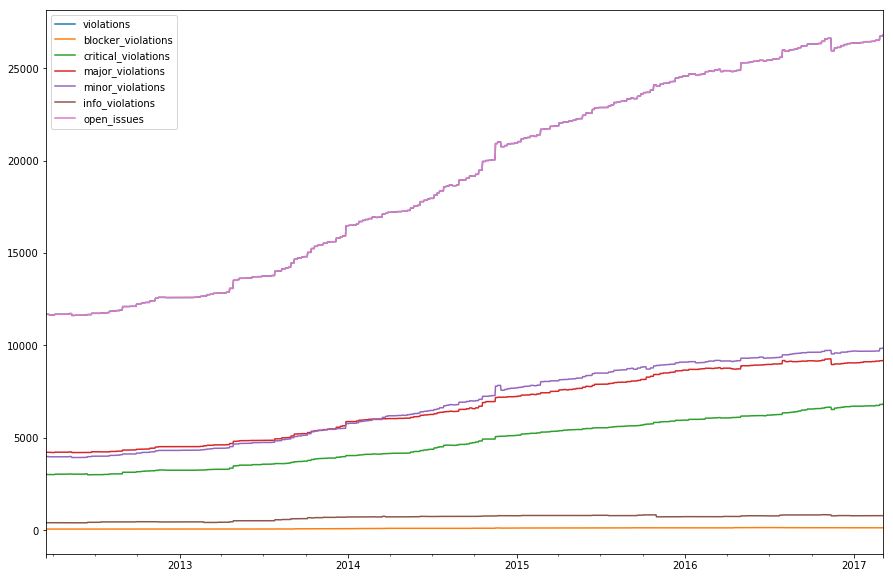

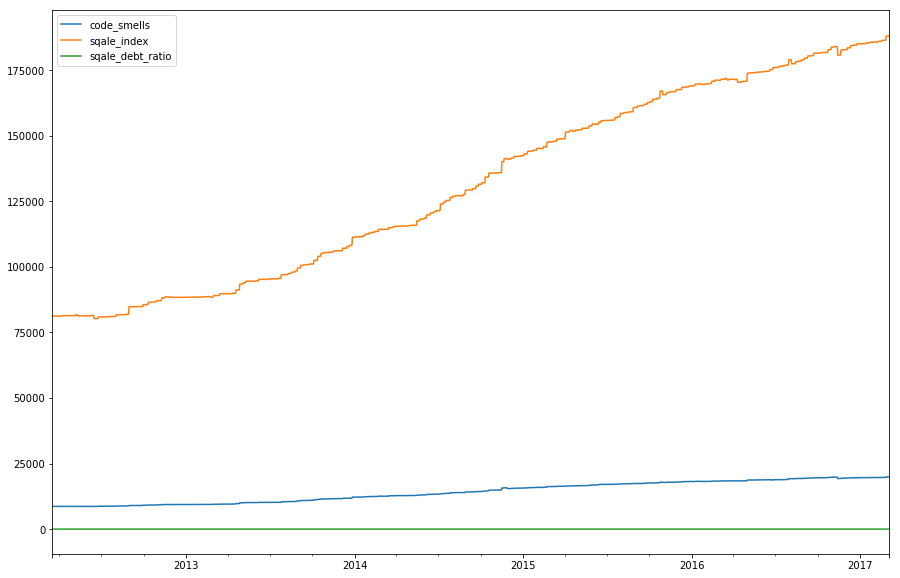

...

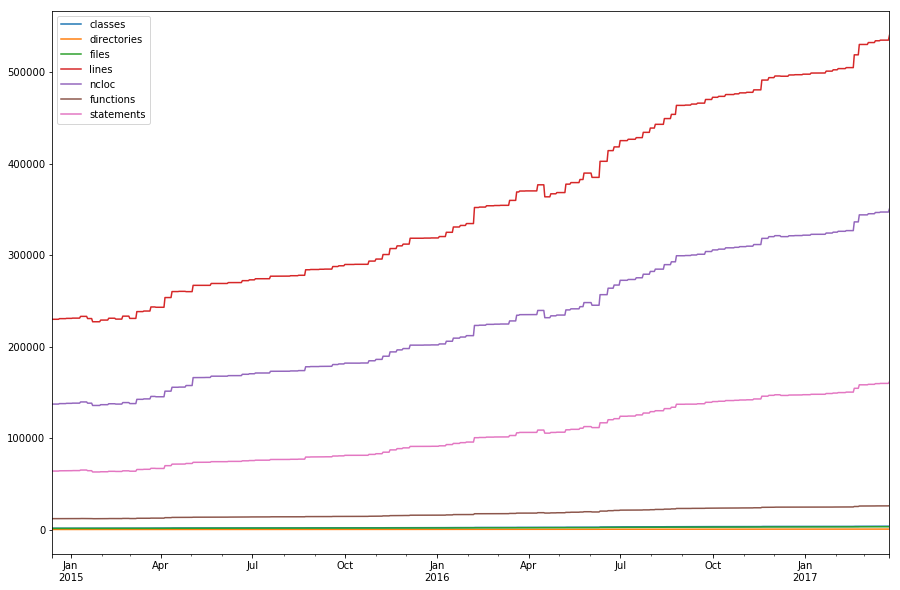

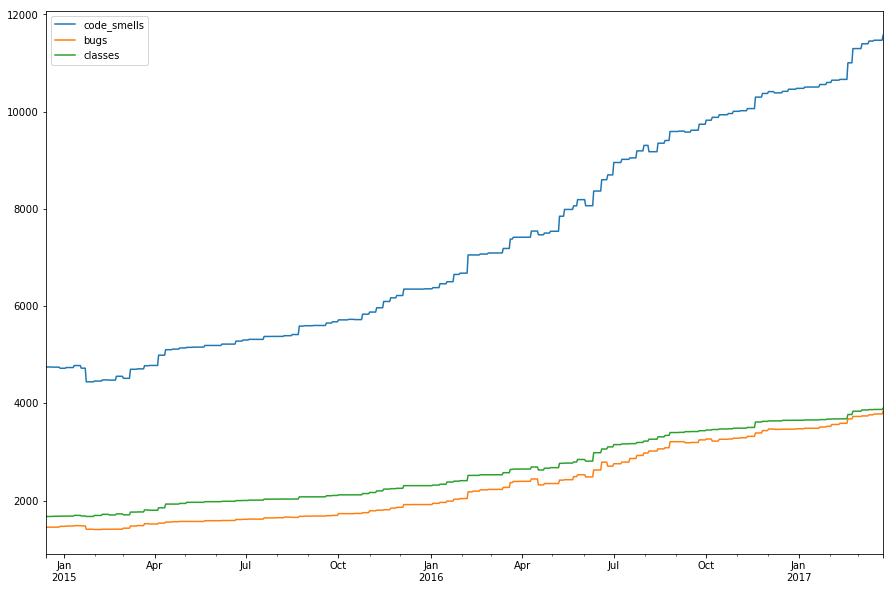

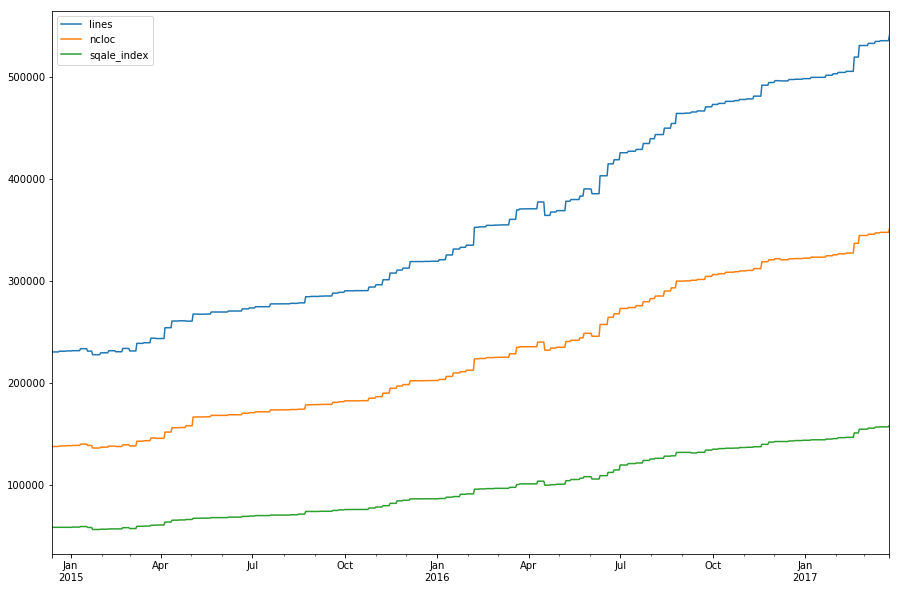

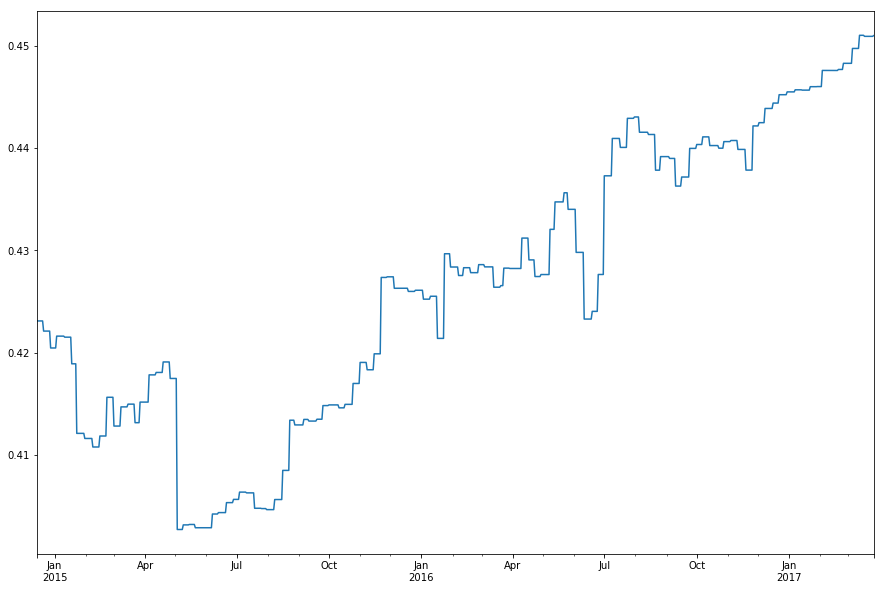

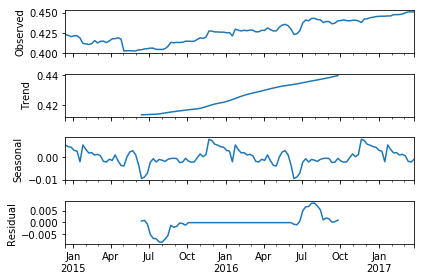

In [10]:
repos = get_repos()
for ghp in repos:
    print(ghp.repo)
    timemachine_metrics = get_sonarqube_timemachine_metrics_DataFrame(ghp)
    timemachine_metrics = timemachine_metrics.fillna(method='ffill')
    timemachine_metrics['normalized_td'] = timemachine_metrics['sqale_index']/timemachine_metrics['ncloc']
    issues = timemachine_metrics[['violations','blocker_violations','critical_violations','major_violations','minor_violations','info_violations','open_issues']]
    smells_bugs_classes = timemachine_metrics[['code_smells','bugs','classes']]
    lines_sqale = timemachine_metrics[['lines','ncloc','sqale_index']]
    
    complexity = timemachine_metrics[['complexity','class_complexity','file_complexity','function_complexity']]
    documentation = timemachine_metrics[['comment_lines','comment_lines_density']]
    duplications = timemachine_metrics[['duplicated_blocks','duplicated_files','duplicated_lines','duplicated_lines_density']]
    maintainability = timemachine_metrics[['code_smells','sqale_index','sqale_debt_ratio']]
    reliability = timemachine_metrics[['bugs','reliability_remediation_effort']]
    security = timemachine_metrics[['vulnerabilities','security_remediation_effort']]
    size = timemachine_metrics[['classes','directories','files','lines','ncloc','functions','statements']]
    
    plot(complexity)
    plot(documentation)
    plot(duplications)
    plot(issues)
    plot(maintainability)
    plot(reliability)
    plot(security)
    plot(size)
    
    plot(smells_bugs_classes)
    plot(lines_sqale)
    plt.figure()
    plot(timemachine_metrics['normalized_td'])
    
    timemachine_metrics = timemachine_metrics[timemachine_metrics.index.weekday==6]
    res = sm.tsa.seasonal_decompose(timemachine_metrics['normalized_td'])
    resplot = res.plot()
    resplot.show()

#     print(timemachine_metrics[['lines','ncloc','classes']].iloc[0])
#     print(timemachine_metrics[['lines','ncloc','classes']].iloc[-1])